# Проект: Исследование рынка заведений общественного питания Москвы

**Цель проекта:** В нашем распоряжении есть данные о заведениях общественного питания Москвы. Необходимо оценить и подготовить презентацию для инвесторов о положение дел на рынке общественного питания и предсказать успешность новой кофейни.

**Описание данных:**

Файл `moscow_places.csv`:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): 0 — заведение не является сетевым, 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Ход работы:**
- Шаг 1. Изучение общей информации
- Шаг 2. Предобработка данных
- Шаг 3. Анализ данных
- Шаг 4. Выводы
- Шаг 5. Детализация исследования: открытие кофейни
- Шаг 6. Рекомендации

## Изучение общей информации

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from scipy import stats
from numpy import median
import os
import json
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker

In [2]:
pd.set_option('display.max_columns', 30)
pd.set_option("display.float_format", "{:.2f}".format)

In [3]:
pth1 = '/datasets/moscow_places.csv'
pth2 = 'moscow_places.csv'
if os.path.exists(pth1):
    df = pd.read_csv(pth1)
elif os.path.exists(pth2):
    df = pd.read_csv(pth2)
else:
    print('Something is wrong')

In [4]:
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,1100.00,NaN,0,65.00


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Файл содержит информацию о 8406 объектах общественного питания. Видим, что по ряду столбцов есть пропуски, в некоторых необходимо заменить тип данных.

## Предобработка данных

In [6]:
print(f'Количество дубликатов: {df.duplicated().sum()}')

Количество дубликатов: 0


In [7]:
print('Количество пропусков в столбцах:')
print(df.isnull().sum())

Количество пропусков в столбцах:
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Заполнять пропуски не будем, так как мы не знаем наверняка, чем их заполнить, данные могут быть искажены. Удалить их так же нельзя, много данных будет потеряно.

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [8]:
# функция для извлечения названия улицы
def street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
# применяем функцию
df['street'] = df.apply(street, axis=1)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица


Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно
- логическое значение False — в противоположном случае. 

In [9]:
# функция для создания столбца
def around_the_clock (row): 
    if row['hours'] == 'ежедневно, круглосуточно': 
        return True
    else: 
        return False
# применяем функцию
df['is_24/7'] = df.apply(around_the_clock, axis=1)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,False


Поменяем типы данных в столбце `chain` на булевый.

In [10]:
# функция для смена типа данных
def bool_type(value):
    if value == 1:
        return True
    elif value == 0:
        return False
# применяем функцию
df['chain'] = df['chain'].apply(bool_type)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24/7            8406 non-null   bool   
dtypes: bool(2), float64(6), 

Теперь можно приступать к анализу.

In [12]:
df.duplicated(subset=['name', 'category', 'district'])

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403    False
8404    False
8405    False
Length: 8406, dtype: bool

## Анализ данных

**Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям. Построим визуализации.**

In [13]:
category_group = df.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
category_group.columns = ['Категория', 'Кол-во объектов']
category_group['Доля'] = category_group['Кол-во объектов'] / category_group['Кол-во объектов'].sum()
category_group

,Категория,Кол-во объектов,Доля
0,кафе,2378,0.28
1,ресторан,2043,0.24
2,кофейня,1413,0.17
3,"бар,паб",765,0.09
4,пиццерия,633,0.08
5,быстрое питание,603,0.07
6,столовая,315,0.04
7,булочная,256,0.03


In [14]:
fig = px.bar(category_group, x='Кол-во объектов', y='Категория', title='Распределение объектов по типам')
fig.update_xaxes(tickangle=45)
fig.show()

Выделяются категории ресторан и кафе: на них приходится более 24% заведений на каждую, в сумме более 50% всех заведений.

**Исследуем количество посадочных мест в местах по категориям. Построим визуализации.**

In [15]:
seats_type = df.groupby('category')['seats'].mean().sort_values(ascending=False).reset_index()
seats_type.columns = ['Категория', 'Кол-во мест']
seats_type

,Категория,Кол-во мест
0,"бар,паб",124.53
1,ресторан,121.94
2,кофейня,111.20
3,столовая,99.75
4,быстрое питание,98.89
5,кафе,97.51
6,пиццерия,94.50
7,булочная,89.39


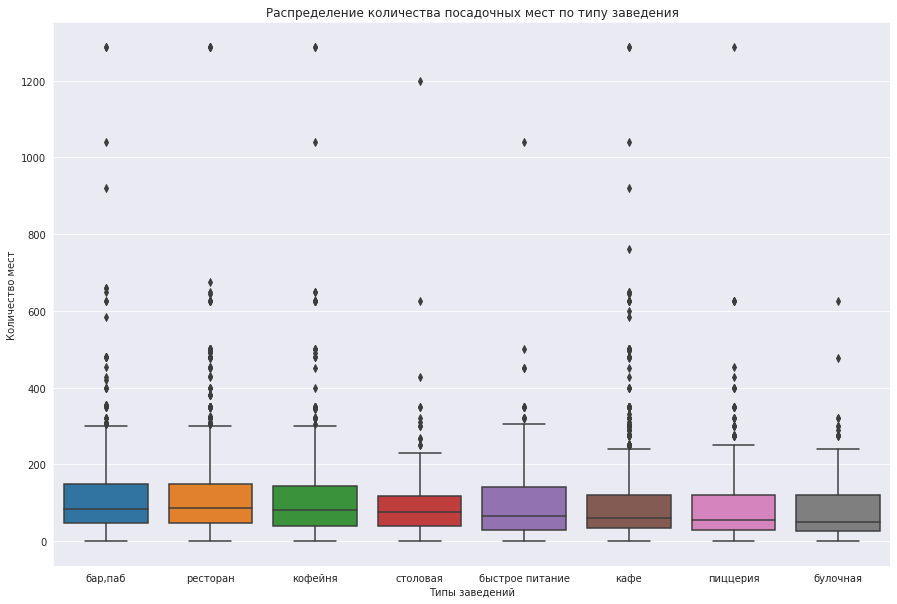

In [16]:
plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
seats_type = df.groupby('category')['seats'].mean().sort_values()[::-1].index
sns.boxplot(x='category', y='seats', data=df, order=seats_type);
plt.title('Распределение количества посадочных мест по типу заведения')
plt.xlabel('Типы заведений')
plt.ylabel('Количество мест')
plt.show()

В среднем количество посадочных мест больше всего в барах, ресторанах и кофейнях. Видим сильные выбросы значений у этих трех типов.

In [17]:
seats_type_median = df.groupby('category')['seats'].median().sort_values(ascending=False).reset_index()
seats_type_median.columns = ['Категория', 'Кол-во мест']
seats_type_median

,Категория,Кол-во мест
0,ресторан,86.00
1,"бар,паб",82.50
2,кофейня,80.00
3,столовая,75.50
4,быстрое питание,65.00
5,кафе,60.00
6,пиццерия,55.00
7,булочная,50.00


In [18]:
fig = px.bar(seats_type_median, x='Категория', y='Кол-во мест', title='Распределение посадочных мест по типам')
fig.update_xaxes(tickangle=45)
fig.show()

**Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [19]:
chain_group = df.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
chain_group.columns = ['Сетевое', 'Кол-во объектов']
chain_group

,Сетевое,Кол-во объектов
0,False,5201
1,True,3205


In [20]:
fig = go.Figure(data=[go.Pie(labels=chain_group['Сетевое'], values=chain_group['Кол-во объектов'])])
fig.update_layout(
    title=dict(text='Распределение сетевых и несетевых заведений в процентах'))
fig.show()

Видим, что чуть больше трети заведений, 38% от общего числа заведений, являются сетевыми, оставшиеся 62% - не сетевые.

**Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.**

In [21]:
chain_type = df.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_type['Всего объектов'] = chain_type[False] + chain_type[True]
chain_type['Доля сетевых'] = chain_type[True] / chain_type['Всего объектов']
chain_type = chain_type.sort_values(by='Доля сетевых', ascending=False)
chain_type.columns = ['Категория', 'Не сетевых', 'Сетевых', 'Всего объектов', 'Доля сетевых']
print(chain_type)

         Категория  Не сетевых  Сетевых  Всего объектов  Доля сетевых
1         булочная          99      157             256          0.61
5         пиццерия         303      330             633          0.52
4          кофейня         693      720            1413          0.51
2  быстрое питание         371      232             603          0.38
6         ресторан        1313      730            2043          0.36
3             кафе        1599      779            2378          0.33
7         столовая         227       88             315          0.28
0          бар,паб         596      169             765          0.22


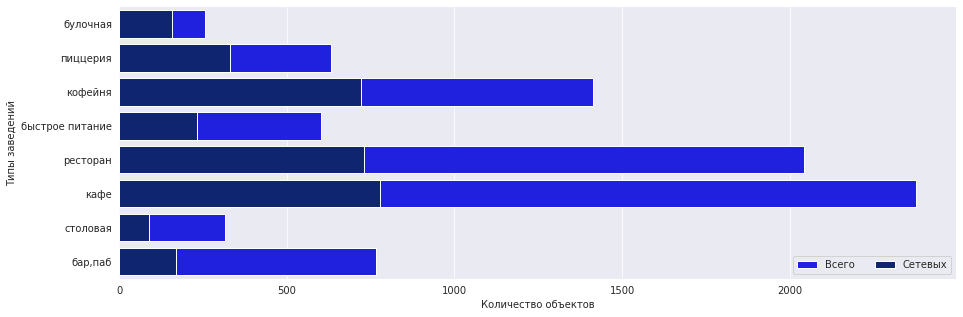

In [22]:
f, ax = plt.subplots(figsize = (15,5))
sns.barplot(x = 'Всего объектов', y = 'Категория', data = chain_type,
            label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('dark')
sns.barplot(x = 'Сетевых', y = 'Категория', data = chain_type,
            label = 'Сетевых', color = 'b', edgecolor = 'w')
sns.set_color_codes('pastel')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel= 'Типы заведений', xlabel= 'Количество объектов')
sns.despine(left = True, bottom = True)
plt.show()

Больше всего сетевых заведений среди булочных, более 60% объектов этого типа относятся к сетевым. Так же выделяются пиццерии и кофейни, более 50% относятся к сетевым.

**Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [23]:
df_chain = df[df['chain'] == True]
name_group = df_chain.groupby('name')['category'].count().sort_values(ascending=False).reset_index()
name_group = name_group.loc[:14]
name_group.columns = ['Наименование заведения', 'Количество объектов']
name_group

,Наименование заведения,Количество объектов
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [24]:
names_top_15 = list(name_group['Наименование заведения'])
top_15_df = df.query('name in @names_top_15')
top_15_df = top_15_df.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
top_15_df['Доля'] = top_15_df['name'] / top_15_df['name'].sum()
top_15_df.columns = ['Категория', 'Количество', 'Доля']
top_15_df

,Категория,Количество,Доля
0,кофейня,336,0.41
1,ресторан,186,0.23
2,пиццерия,151,0.19
3,кафе,100,0.12
4,булочная,25,0.03
5,быстрое питание,12,0.01
6,"бар,паб",4,0.00
7,столовая,2,0.00


Большая часть из топ-15 заведений относится к кофейням (более 40%). Меньше всего столовых, баров и заведений быстрого питания.

**Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам.**

In [25]:
district_df = (
    df.pivot_table(
        index='district',
        columns=['category'],
        values='name',
        aggfunc='count',
        margins=True, 
        fill_value=0 
    )
    .iloc[:-1] 
    .sort_values('All', ascending=False) 
    .head(15) 
    .sort_values('All', ascending=True) 
     .reset_index() 
    )

district_df

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
1,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
2,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
3,Восточный административный округ,53,25,71,272,105,72,160,40,798
4,Западный административный округ,50,37,62,239,150,71,218,24,851
5,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
6,Южный административный округ,68,25,85,264,131,73,202,44,892
7,Северный административный округ,68,39,58,235,193,77,189,41,900
8,Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [26]:
fig = px.bar(district_df, 
             y='district', 
             x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             title='Распределение объектов по округам и типам')
fig.update_layout(xaxis_title='Количество объектов',
                   yaxis_title='Округ')
fig.update_xaxes(tickangle=45)
fig.show()

В центре Москвы самое большое количество объектов, сильно выделяется количество ресторанов. Так же можно отметить большую долю кофеен, баров/пабов и кафе.

**Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [27]:
category_rating = df.groupby('category')['rating'].mean().sort_values(ascending=False).reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


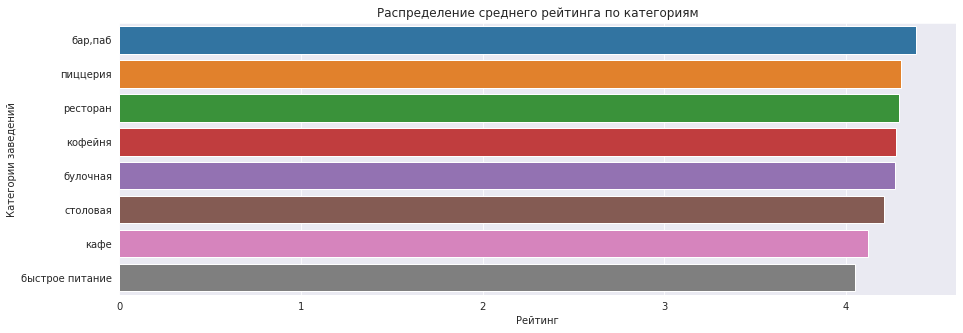

In [28]:
plt.figure(figsize=(15, 5))
sns.barplot(x='rating', y='category', data=category_rating)
plt.title('Распределение среднего рейтинга по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Категории заведений')
plt.show()

Видим, что самый высокий средний рейтинг у баров, пабов, 4.39. Далее идут примерно на одном уровне 4.3 рейтинга: пиццерия, ресторан, кофейня и булочная. С самыми низким рейтингом 4.05 оказались заведения быстрого питания.

**Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`.
Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [29]:
district_rating = df.groupby('district')['rating'].mean().sort_values(ascending=False).reset_index()

In [30]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
 
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
 
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# def create_marker(row):
    # Marker([row['lat'], row['lng']],
        # popup=f"{row['name']} {row['rating']}"
    # ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
# df.apply(create_marker, axis=1)

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Самое большое скопление объектов в центре Москвы.

**Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.**

In [31]:
chart_df = (
    df.pivot_table(
        index='street',
        columns=['category'],
        values='name',
        aggfunc='count',
        margins=True, 
        fill_value=0 
    )
    .iloc[:-1] 
    .sort_values('All', ascending=False) 
    .head(15) 
    .sort_values('All', ascending=True) 
     .reset_index() 
    )

chart_df

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,Пятницкая улица,9,3,2,7,6,3,18,0,48
1,улица Миклухо-Маклая,3,0,4,21,4,2,15,0,49
2,Кутузовский проспект,2,1,2,14,13,3,16,3,54
3,улица Вавилова,2,2,11,15,10,3,12,0,55
4,Люблинская улица,5,0,5,26,11,1,10,2,60
5,МКАД,1,0,9,45,4,0,5,1,65
6,Ленинградское шоссе,5,2,5,13,13,3,26,3,70
7,Варшавское шоссе,6,0,7,18,14,4,20,7,76
8,Каширское шоссе,2,0,10,20,16,5,19,5,77
9,Дмитровское шоссе,6,2,10,23,11,8,24,4,88


In [32]:
fig = px.bar(chart_df, 
             y='street', 
             x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             title='Распределение объектов по топ-15 улиц')
fig.update_layout(xaxis_title='Количество объектов',
                   yaxis_title='Улица')
fig.update_xaxes(tickangle=45)
fig.show()

На проспекте мира больше всего объектов, преобладают рестораны, кафе и кофейни.

**Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [33]:
streets_object = (df.groupby('street')
                        .agg({'name':'count'})
                        .reset_index())
streets_with_1_object = streets_object[streets_object['name']==1]
streets_with_1_object = list(streets_with_1_object['street'])
df_1_object = df.query('street in @streets_with_1_object')

In [34]:
fig = px.bar(df_1_object, 
             y='district', 
             color='category', 
             title='Распределение объектов, которые единственные на своей улице по округам')
fig.update_layout(xaxis_title='Количество объектов',
                   yaxis_title='Административный район')
fig.show()

In [35]:
chain_group_1 = df_1_object.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
chain_group_1.columns = ['Сетевое', 'Кол-во объектов']
chain_group_1

,Сетевое,Кол-во объектов
0,False,325
1,True,133


In [36]:
fig = go.Figure(data=[go.Pie(labels=chain_group_1['Сетевое'], values=chain_group['Кол-во объектов'])])
fig.update_layout(
    title=dict(text='Распределение сетевых и несетевых заведений в процентах'))
fig.show()

Скопление подобных заведений в ЦАО, вероятно потому, что в центре Москвы много маленьких улиц. 

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.**

In [37]:
middle_avg_bill_district = df.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()

In [38]:
# создаём карту Москвы
m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m_1)

marker_cluster = MarkerCluster().add_to(m_1)

# выводим карту
m_1

Самый высокий чек оказался в ЦАО, ЗАО. В ЗАО, как видно по карте, входит аэропорт Внуково, цены в аэропортах как правило сильно завышены, это могло повлиять на средний чек заведений в округе.

## Выводы

- Из всех категорий выделяются больше всего ресторан и кафе: на них приходится более 24% заведений на каждую, в сумме более 50% всех заведений.
- В среднем количество посадочных мест больше всего в барах, ресторанах и кофейнях, более 80 мест.
- Чуть больше трети заведений, 38% от общего числа заведений, являются сетевыми, оставшиеся 62% - не сетевые. Больше всего сетевых заведений среди булочных, более 60% объектов этого типа относятся к сетевым. Так же выделяются пиццерии и кофейни, более 50% относятся к сетевым.
- Самый высокий средний рейтинг у баров, пабов, 4.39. Далее идут примерно на одном уровне 4.3 рейтинга: пиццерия, ресторан, кофейня и булочная. С самыми низким рейтингом 4.05 оказались заведения быстрого питания.
- На проспекте мира больше всего объектов, преобладают рестораны, кафе и кофейни.
- Самый высокий чек оказался в ЦАО, ЗАО. 

## Детализация исследования: открытие кофейни

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
Есть ли круглосуточные кофейни?
Какие у кофеен рейтинги? Как они распределяются по районам?
На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [39]:
df_cofe = df[df['category'] == 'кофейня']

In [40]:
print('Всего кофеен в датасете', df_cofe.shape[0], ', из них круглосуточных', df_cofe[df_cofe['is_24/7'] == True].shape[0])

Всего кофеен в датасете 1413 , из них круглосуточных 59


In [41]:
print('Среднее число посадочных мест в кофейне:', df_cofe['seats'].median())

Среднее число посадочных мест в кофейне: 80.0


In [42]:
df_cofe_count_rat = (df_cofe.groupby('district')
                     .agg({'name': 'count', 'rating': 'mean', 'middle_coffee_cup': 'median'})
                     .sort_values(by='name', ascending=False))
df_cofe_count_rat.columns = ['Количество', 'Средний рейтинг', 'Средняя стоимость чашки кофе']
df_cofe_count_rat

,Количество,Средний рейтинг,Средняя стоимость чашки кофе
district,,,
Центральный административный округ,428,4.34,190.00
Северный административный округ,193,4.29,159.00
Северо-Восточный административный округ,159,4.22,162.50
Западный административный округ,150,4.20,189.00
Южный административный округ,131,4.23,150.00
Восточный административный округ,105,4.28,135.00
Юго-Западный административный округ,96,4.28,198.00
Юго-Восточный административный округ,89,4.23,147.50
Северо-Западный административный округ,62,4.33,165.00


In [43]:
fig = px.bar(df_cofe_count_rat,
             x='Количество',
             title='Распределение кофеен по округам')
fig.update_layout(xaxis_title='Количество объектов',
                   yaxis_title='Административный округ')
fig.update_xaxes(tickangle=45)
fig.show()

In [44]:
fig = px.bar(df_cofe_count_rat.sort_values(by='Средняя стоимость чашки кофе', ascending=False),
             x='Средняя стоимость чашки кофе',
             title='Распределение средней стоимости чашки кофе по округам')
fig.update_layout(xaxis_title='Средняя стоимость чашки кофе',
                   yaxis_title='Административный округ')
fig.update_xaxes(tickangle=45)
fig.show()

In [45]:
# создаём карту Москвы
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
 
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_2)

marker_cluster = MarkerCluster().add_to(m_2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cofe.apply(create_clusters, axis=1)

# выводим карту
m_2

В ЦАО расположилась самая больная часть кофеен с большим отрывом от остальных округов, 428 кофеен. С самым маленьким количеством оказались Юго-Западный, Юго-Восточный, Северо-Западный административные округа. При этом средняя стоимость чашки кофе выше всего в Юго-Западном округе, затем идет ЦАО. Средний рейтинг заведений по округам варьируется между 4.20 и 4.34.

In [46]:
print('Средняя цена чашки кофе:', df_cofe['middle_coffee_cup'].median())

Средняя цена чашки кофе: 170.0


## Рекомендации

- Район расположения: напрямую зависит от желаемой стоимости аренды помещения, информации об этом у нас в данном исследовании нет. Если важен большой поток клиентов, а стоимость аренды не так важна, можно открыть кофейню в ЦАО, так как проходимость там больше, особенно если открывать кофейню около метро/в торговых центрах/других самых проходимых точках. Так же можно рассмотреть Юго-западный административный округ, но ближе к центру, в доступных точках, кофеен там мало, цены выше остальных округов. Но поток клиентов, вероятно, будет гораздо ниже.
- По цене одной чашки капучино стоит ориетироваться на среднюю стоимость по району, можно рассмотреть более узкий круг цен кофеен, которые находятся ближе всего к месту открытия. В данном случае у нас средняя цена чашки по городу - 170 рублей.
- Количество посадочных мест стоит брать медианную среди всех кофеен. В данном случае это 80 мест. 

Ссылка на презентацию: https://disk.yandex.ru/i/-AoMEG-eknypjw